## Importing EDA libraries

In [50]:
import pandas as pd
import matplotlib
from ydata_profiling import ProfileReport

## Read CSV

In [51]:
df = pd.read_csv('Assignment_Train.csv')

## Create data profile

In [52]:
profile = ProfileReport(df, title="Profiling Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

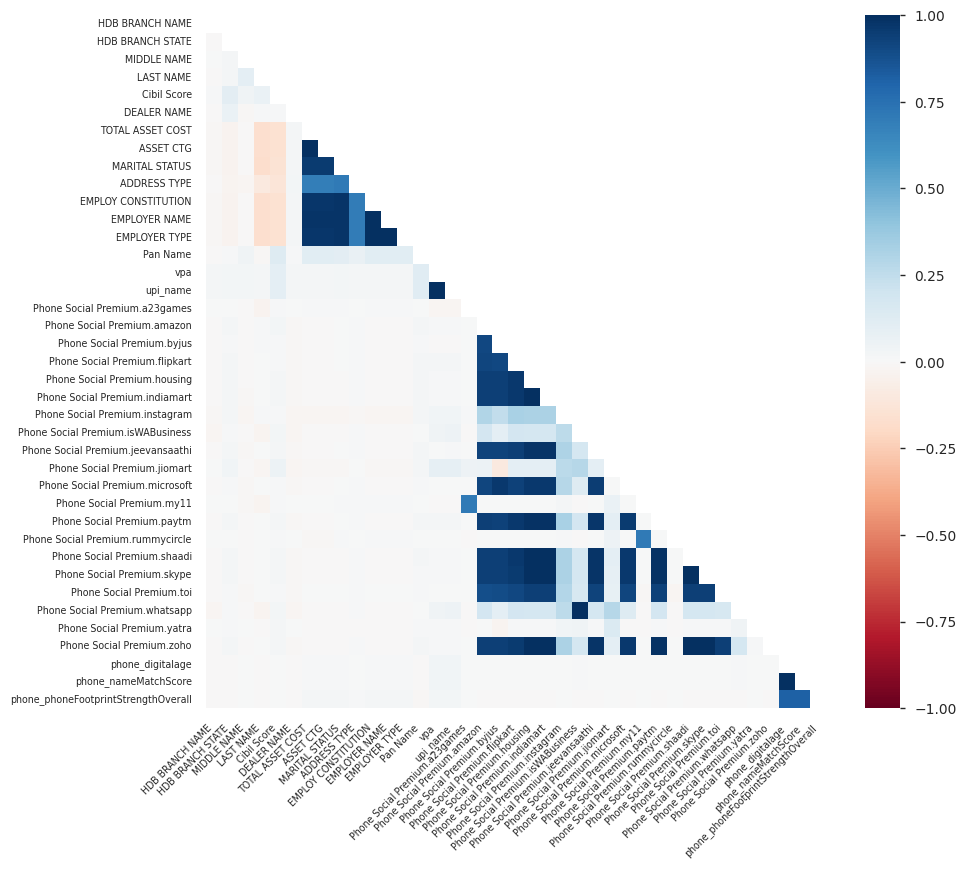

In [53]:
profile

In [54]:
profile.to_file("EDA_Report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Select rows with correlation coefficient  greater than 0.05

In [5]:
df_train= df[['ADDRESS TYPE', 'AGE', 'ASSET CTG', 'ASSET MODEL NO', 'EMPLOYER TYPE', 'HDB BRANCH STATE', 'PRIMARY ASSET MAKE', 'TOTAL ASSET COST', 'phone_nameMatchScore', 'Application Status']]

In [6]:
df

,DEALER ID,APPLICATION LOGIN DATE,HDB BRANCH NAME,HDB BRANCH STATE,FIRST NAME,MIDDLE NAME,LAST NAME,mobile,AADHAR VERIFIED,Cibil Score,...,Phone Social Premium.shaadi,Phone Social Premium.skype,Phone Social Premium.toi,Phone Social Premium.whatsapp,Phone Social Premium.yatra,Phone Social Premium.zoho,phone_digitalage,phone_nameMatchScore,phone_phoneFootprintStrengthOverall,Application Status
0,106989,07/20/2022,DELHI-SF,DELHI,SUNIL,NaN,CHANDER,9210574080,NO,726,...,0.0,0.0,1.0,NaN,NaN,0.0,5324.0,67.222222,High,APPROVED
1,108975,07/28/2022,PATNA-SF,BIHAR,AMRIT,NaN,KUMAR,8877987018,NO,NaN,...,0.0,0.0,0.0,NaN,NaN,0.0,1998.0,100.000000,High,APPROVED
2,111004,07/15/2022,DARJEELING-SF,WEST BENGAL,ANIMESH,NaN,THAPA,8910862135,NO,737,...,0.0,0.0,0.0,NaN,NaN,0.0,-1.0,-1.000000,Low,APPROVED
3,192020,07/04/22,SAHARANPUR-SF,UTTAR PRADESH,ADITYA,NaN,SINGH,9758428017,NO,713,...,0.0,0.0,1.0,NaN,NaN,0.0,1998.0,72.777778,High,APPROVED
4,55095,07/15/2022,MODASA-SF,GUJARAT,PARMAR,HARESHBHAI,AMRUTBHAI,9687028486,NO,669,...,0.0,0.0,1.0,NaN,NaN,0.0,1998.0,68.095238,High,DECLINED
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,105101,07/11/22,FARRUKHABAD-SF,UTTAR PRADESH,AJAY,NaN,NARESH,8400644964,NO,NaN,...,0.0,1.0,1.0,NaN,NaN,0.0,-1.0,60.576923,Medium,APPROVED
9996,85054,07/04/22,BHAGALPUR-SF,BIHAR,SURESH,KUMAR,PRASAD,9708883564,NO,NaN,...,0.0,0.0,0.0,0.0,NaN,0.0,1998.0,71.078431,High,APPROVED
9997,53710,07/10/22,LUDHIANA-SF,PUNJAB,SANJAY,NaN,AAGAN,9888532016,NO,NaN,...,0.0,0.0,0.0,1.0,NaN,0.0,1988.0,100.000000,Medium,APPROVED
9998,89240,07/29/2022,MEERUT-SF,UTTAR PRADESH,SANJAY,NaN,SINGH,8923338426,NO,NaN,...,0.0,0.0,0.0,NaN,NaN,0.0,1096.0,-1.000000,Low,APPROVED


In [7]:
len(df['Application Status'].unique())

2

## AutoML for model exploration

In [9]:
from supervised.automl import AutoML
from sklearn.model_selection import train_test_split

In [13]:
X, y = df_train.drop(columns=['Application Status']), df_train['Application Status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [14]:
X_train

,ADDRESS TYPE,AGE,ASSET CTG,ASSET MODEL NO,EMPLOYER TYPE,HDB BRANCH STATE,PRIMARY ASSET MAKE,TOTAL ASSET COST,phone_nameMatchScore
8371,RESIDENCE,27,NaN,154116,NaN,MAHARASHTRA,HONDA MOTORS,NaN,100.000000
5027,Parental,23,MCEXA,178903,SALARIED,DELHI,TVS MOTOR CO,107524.0,18.181818
9234,RESIDENCE,30,NaN,134123,NaN,PUNJAB,HONDA MOTORS,NaN,100.000000
3944,RESIDENCE,35,SCECA,143241,SELF-EMPLOYED,ORISSA,HONDA MOTORS,90198.0,100.000000
6862,NaN,25,NaN,134122,NaN,ANDHRA PRADESH,HERO MOTORS,NaN,100.000000
...,...,...,...,...,...,...,...,...,...
5734,Self/Spouse Owned,26,MCEXA,139542,SELF-EMPLOYED,MADHYA PRADESH,HONDA MOTORS,97479.0,100.000000
5191,RESIDENCE,0,NaN,178540,NaN,UTTAR PRADESH,ROYAL ENFIELD BIKES INDIA,NaN,100.000000
5390,NaN,24,NaN,174641,NaN,KARNATAKA,HONDA MOTORS,NaN,86.113700
860,RESIDENCE,44,NaN,140208,NaN,NaN,HERO MOTORS,NaN,-1.000000


In [18]:
automl = AutoML(mode="Compete",eval_metric='auc',
                random_state=42,
                algorithms=['Random Forest', 'Extra Trees', 'LightGBM', 
                            'Xgboost', 'CatBoost', 'Neural Network'],
                start_random_models=10,
    hill_climbing_steps=3,
    top_models_to_improve=3,
    golden_features=True,
               validation_strategy={
                        "validation_type": "split",
                        "train_ratio": 0.8,
                        "shuffle": True,
                        "stratify": True
                    })
automl.fit(X_train, y_train)

predictions = automl.predict(X_test)

Disable stacking for split validation
AutoML directory: AutoML_4
The task is binary_classification with evaluation metric auc
AutoML will use algorithms: ['Random Forest', 'Extra Trees', 'LightGBM', 'Xgboost', 'CatBoost', 'Neural Network']
AutoML will ensemble available models
AutoML steps: ['simple_algorithms', 'default_algorithms', 'not_so_random', 'mix_encoding', 'golden_features', 'kmeans_features', 'insert_random_feature', 'features_selection', 'hill_climbing_1', 'hill_climbing_2', 'hill_climbing_3', 'ensemble']
Skip simple_algorithms because no parameters were generated.
* Step default_algorithms will try to check up to 6 models
1_Default_LightGBM auc 0.895769 trained in 4.16 seconds
2_Default_Xgboost auc 0.90088 trained in 0.93 seconds
3_Default_CatBoost auc 0.899233 trained in 1.26 seconds
4_Default_NeuralNetwork auc 0.882991 trained in 2.33 seconds
5_Default_RandomForest auc 0.8928 trained in 3.51 seconds
6_Default_ExtraTrees auc 0.875197 trained in 1.75 seconds
* Step not_so_

/home/hn-on-fire/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


32_CatBoost_KMeansFeatures auc 0.905402 trained in 3.15 seconds


/home/hn-on-fire/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


33_CatBoost_KMeansFeatures auc 0.903435 trained in 2.65 seconds


/home/hn-on-fire/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


26_CatBoost_KMeansFeatures auc 0.899726 trained in 2.52 seconds
* Step insert_random_feature will try to check up to 1 model
log_loss_eps() got an unexpected keyword argument 'response_method'
Problem during computing permutation importance. Skipping ...
32_CatBoost_RandomFeature auc 0.902524 trained in 2.41 seconds
Skip features_selection because no parameters were generated.
* Step hill_climbing_1 will try to check up to 22 models
61_CatBoost auc 0.907321 trained in 2.29 seconds
62_CatBoost auc 0.899098 trained in 2.37 seconds
63_CatBoost auc 0.904046 trained in 2.59 seconds


/home/hn-on-fire/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


64_CatBoost auc 0.905574 trained in 2.93 seconds


/home/hn-on-fire/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


65_CatBoost auc 0.896573 trained in 2.69 seconds
66_Xgboost auc 0.901198 trained in 1.88 seconds
67_Xgboost auc 0.901352 trained in 1.91 seconds
68_LightGBM auc 0.89906 trained in 1.86 seconds
69_LightGBM auc 0.898976 trained in 1.85 seconds
70_LightGBM auc 0.899676 trained in 1.89 seconds
71_LightGBM auc 0.901019 trained in 1.92 seconds
72_Xgboost auc 0.899994 trained in 1.95 seconds
73_Xgboost auc 0.899842 trained in 1.95 seconds
74_RandomForest auc 0.900078 trained in 2.67 seconds
75_LightGBM auc 0.901382 trained in 1.92 seconds
76_RandomForest auc 0.898265 trained in 2.64 seconds
77_Xgboost auc 0.900789 trained in 2.1 seconds
78_Xgboost auc 0.898771 trained in 2.1 seconds
79_RandomForest auc 0.896666 trained in 3.2 seconds
80_ExtraTrees auc 0.879862 trained in 2.49 seconds
81_ExtraTrees auc 0.878936 trained in 2.59 seconds
82_ExtraTrees auc 0.876612 trained in 4.33 seconds
* Step hill_climbing_2 will try to check up to 26 models
83_CatBoost auc 0.90391 trained in 3.21 seconds
84_Ca

/home/hn-on-fire/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


87_CatBoost auc 0.903084 trained in 2.74 seconds


/home/hn-on-fire/.local/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning


88_CatBoost auc 0.906431 trained in 3.31 seconds
89_LightGBM auc 0.896929 trained in 1.9 seconds
90_Xgboost auc 0.9003 trained in 2.0 seconds
91_RandomForest auc 0.89923 trained in 2.53 seconds
92_RandomForest auc 0.899744 trained in 2.59 seconds
93_RandomForest auc 0.900044 trained in 2.69 seconds
94_RandomForest auc 0.898885 trained in 2.61 seconds
95_RandomForest auc 0.898522 trained in 3.08 seconds
96_RandomForest auc 0.900949 trained in 2.57 seconds
97_NeuralNetwork auc 0.858555 trained in 3.42 seconds
98_NeuralNetwork auc 0.879714 trained in 4.35 seconds
99_NeuralNetwork auc 0.876185 trained in 2.5 seconds
100_NeuralNetwork auc 0.881484 trained in 3.29 seconds
101_ExtraTrees auc 0.878802 trained in 2.54 seconds
102_ExtraTrees auc 0.874017 trained in 3.17 seconds
103_ExtraTrees auc 0.875922 trained in 3.18 seconds
104_ExtraTrees auc 0.872469 trained in 3.15 seconds
105_ExtraTrees auc 0.878187 trained in 3.12 seconds
106_ExtraTrees auc 0.876993 trained in 2.84 seconds
107_NeuralNet

In [19]:
predictions

array(['DECLINED', 'APPROVED', 'DECLINED', ..., 'APPROVED', 'APPROVED',
       'APPROVED'], dtype=object)

In [20]:
from sklearn import metrics 

## Test Metrics

In [21]:
actual, predicted = y_test, predictions
confusion_matrix = metrics.confusion_matrix(actual, predicted) 

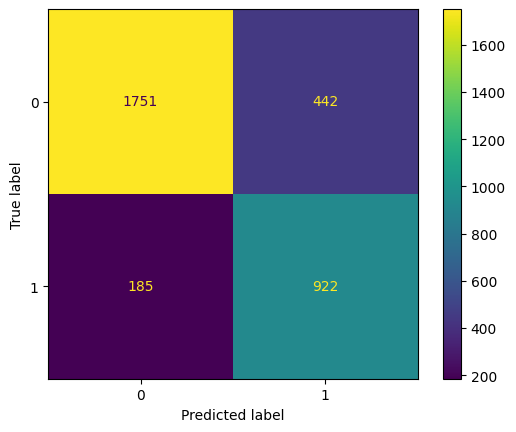

In [32]:
%matplotlib inline
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1]) 
import matplotlib.pyplot as plt 
cm_display.plot()


In [30]:
Accuracy = metrics.accuracy_score(actual, predicted) 
Precision = metrics.precision_score(actual, predicted, pos_label='APPROVED') 
Recall = metrics.recall_score(actual, predicted, pos_label='APPROVED') 
Specificity = metrics.recall_score(actual, predicted, pos_label='APPROVED')
F1_score = metrics.f1_score(actual, predicted, pos_label='APPROVED')
print({"Accuracy":Accuracy,"Precision":Precision,"Recall":Recall,"Specificity":Specificity,"F1_score":F1_score})

{'Accuracy': 0.81, 'Precision': 0.9044421487603306, 'Recall': 0.7984496124031008, 'Specificity': 0.7984496124031008, 'F1_score': 0.8481472511503997}


## Train metrics

In [33]:
predictions = automl.predict(X_train)

In [34]:
actual, predicted = y_train, predictions
confusion_matrix = metrics.confusion_matrix(actual, predicted) 

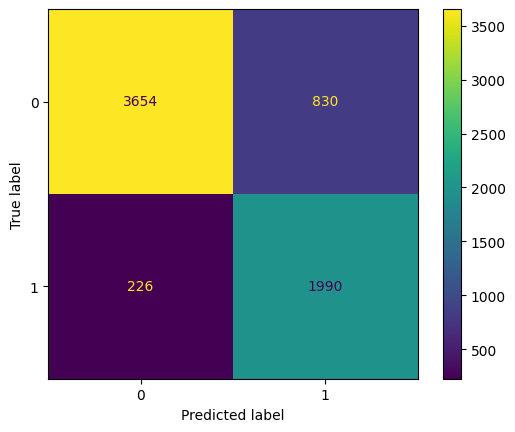

In [35]:
%matplotlib inline
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [0, 1]) 
import matplotlib.pyplot as plt 
cm_display.plot()


In [37]:
Accuracy = metrics.accuracy_score(actual, predicted) 
Precision = metrics.precision_score(actual, predicted, pos_label='APPROVED') 
Recall = metrics.recall_score(actual, predicted, pos_label='APPROVED') 
Specificity = metrics.recall_score(actual, predicted, pos_label='APPROVED')
F1_score = metrics.f1_score(actual, predicted, pos_label='APPROVED')
print({"Accuracy":Accuracy,"Precision":Precision,"Recall":Recall,"Specificity":Specificity,"F1_score":F1_score})

{'Accuracy': 0.8423880597014926, 'Precision': 0.9417525773195876, 'Recall': 0.8148974130240857, 'Specificity': 0.8148974130240857, 'F1_score': 0.8737446197991393}


# Please note that the assignment was wrapped up in 25 minutes as it was delegated in the midst of Ganesh Chaturthi and on a very short time duration which is hard to  manage with my current part-time job and studies. Further steps can include Hyperparmeter tuning using grid search and indepth tuning of the selected model especially by up/down sampling to balance the sample space and and using different forms of encoding for nominal and ordinal variables

In [39]:
df_test = pd.read_csv("Assignment_Test.csv")

In [44]:
df_test['Prediction'] = automl.predict(df_test)

In [48]:
df_test[['UID', 'Prediction']].to_csv('results.csv')